In [1]:
import missingno
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from utils import *

get_ipython().run_line_magic('load_ext', 'autoreload')
get_ipython().run_line_magic('autoreload', '2')

In [2]:
df_train = pd.read_csv("../datasets/train_processed.csv", index_col=0)
df_new = df_train.drop(["Next_Tmin", "Next_Tmax"], axis=1)

df_val = pd.read_csv("../datasets/val_processed.csv", index_col=0)
df_val_save = df_val.drop(["Next_Tmin", "Next_Tmax"], axis=1)

df_test = pd.read_csv("../datasets/test_processed.csv", index_col=0)
df_test_save = df_test.drop(["Next_Tmin", "Next_Tmax"], axis=1)

df_train

,station,Present_Tmax,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC2,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lon,Slope,Solar radiation,Next_Tmin,Next_Tmax
2798,24.0,25.3,53.098980,88.314713,28.838707,22.714764,4.491992,35.357061,0.397159,0.536422,0.217628,0.000000,0.000000,0.000000,126.909,0.2223,4849.283203,22.9,28.9
1429,5.0,30.0,57.957870,88.353050,28.629040,22.664603,5.869879,89.331824,0.218586,0.001589,0.000000,0.000000,0.007546,0.000000,127.135,0.5055,4563.660156,21.5,31.4
4835,11.0,32.6,37.920181,77.275185,33.550047,24.529717,6.451454,71.790871,0.015765,0.278280,0.000000,0.000000,0.000000,0.000000,127.085,0.6233,5795.268066,22.2,33.6
5434,10.0,30.0,66.996681,95.048515,26.293850,23.365634,4.801002,34.452793,0.790333,0.787790,4.833832,2.626041,0.000000,0.029888,126.955,5.1782,5352.822754,22.2,31.1
7260,11.0,31.3,54.651810,80.519485,28.943090,24.040451,6.525222,49.586287,0.356729,0.679298,0.000000,0.000000,0.000000,0.000000,127.085,0.6233,5102.056152,23.8,28.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6980,6.0,33.5,49.282288,84.976288,34.561699,26.705811,5.534268,81.235738,0.229199,0.464349,0.000000,0.000000,0.000000,12.055163,127.042,0.1457,5404.668457,26.7,33.4
5723,24.0,34.8,46.886745,84.179184,34.680169,28.586751,6.206956,57.148986,0.013230,0.010946,0.000000,0.000000,0.000000,0.000000,126.909,0.2223,5047.767578,27.7,35.6
5264,15.0,31.8,51.766171,82.884941,32.157013,27.149286,8.539820,32.274478,0.126622,0.101377,0.006876,0.000000,0.000000,0.000000,126.937,0.8552,5538.563477,25.1,32.1
2835,11.0,24.7,57.398273,93.838325,28.527854,22.080858,6.573750,38.056711,0.278724,0.151631,0.005907,0.000000,0.000000,0.000000,127.085,0.6233,4804.658203,20.6,29.4


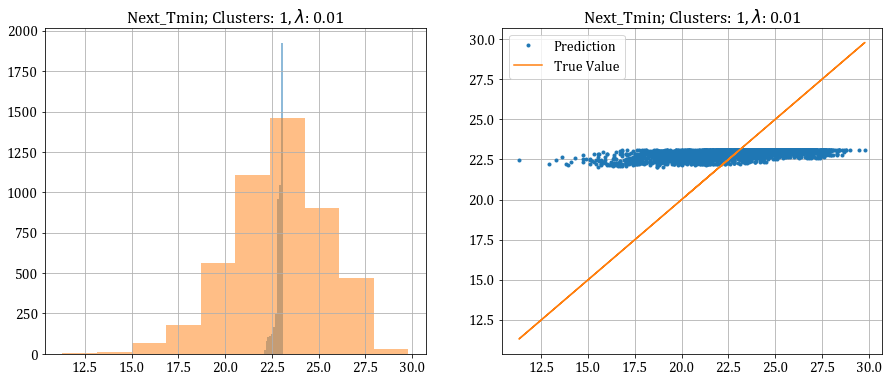

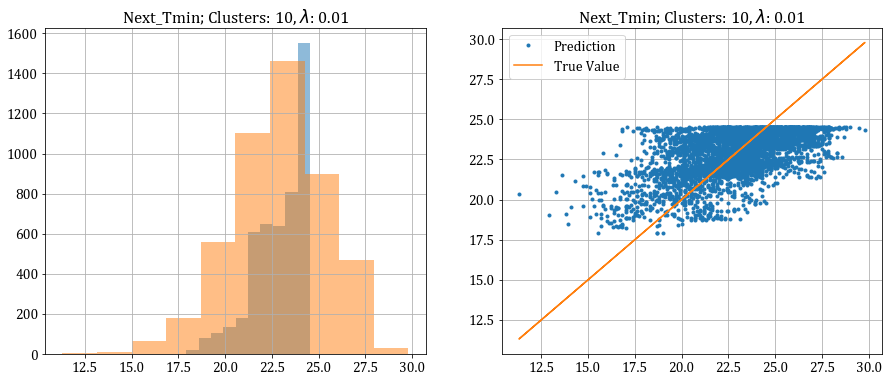

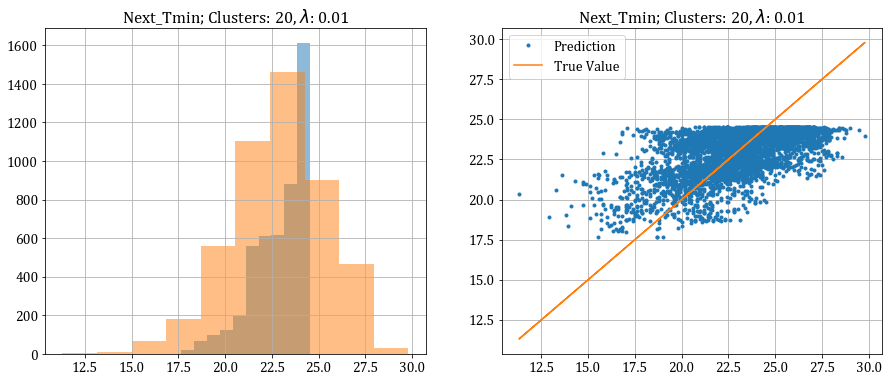

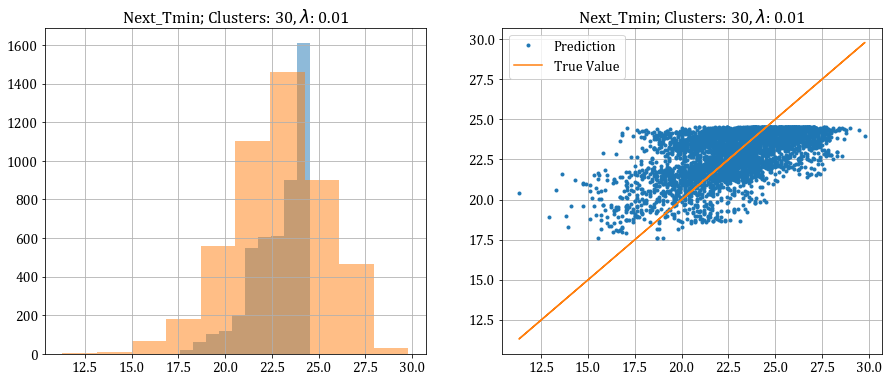

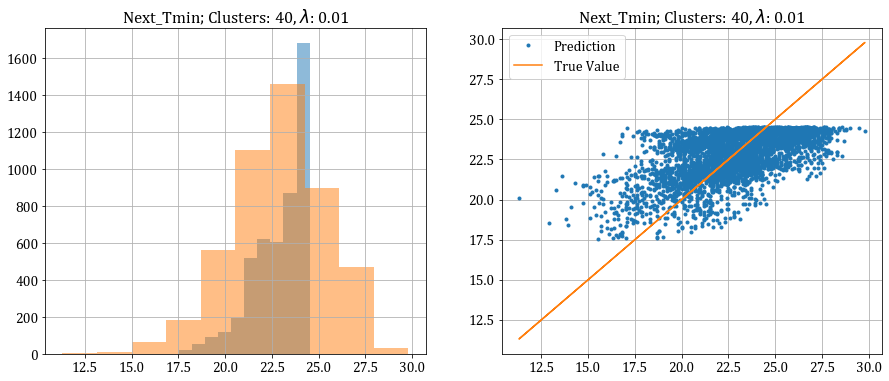

...

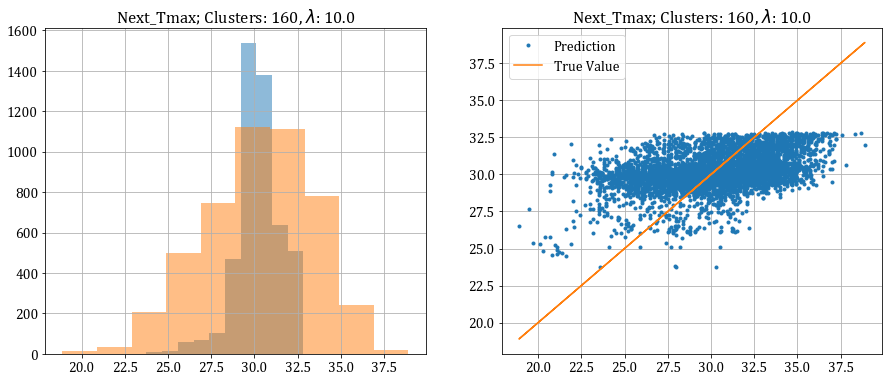

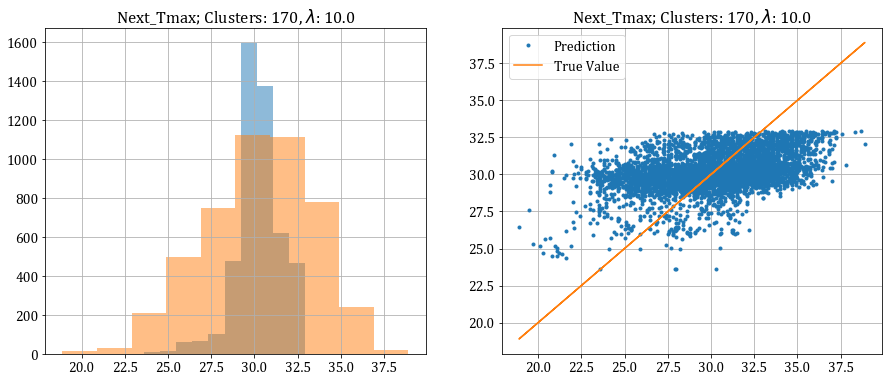

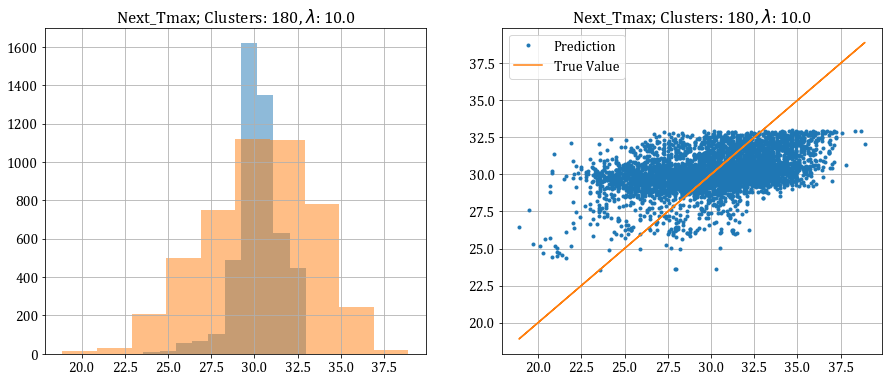

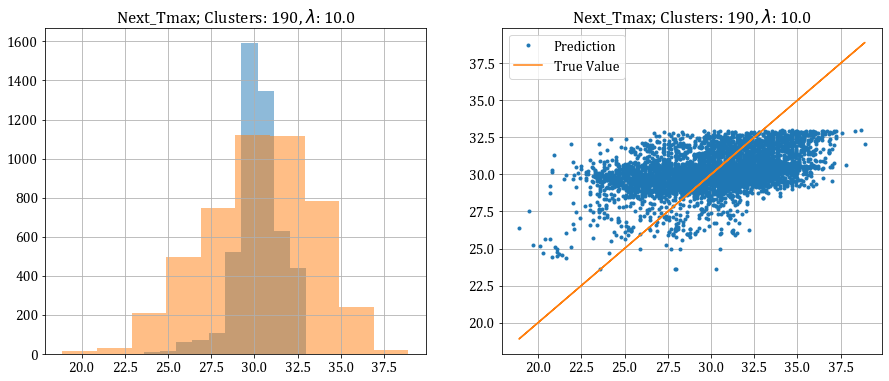

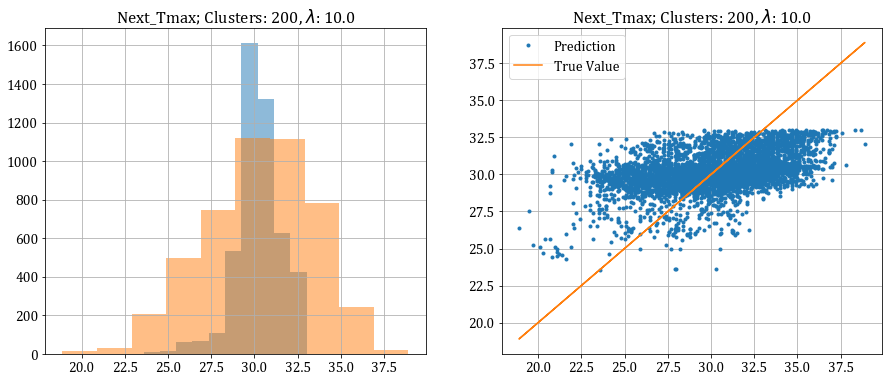

In [3]:
num_clusters = [1]
num_clusters.extend(range(10, 201, 10))

lambda_list = [0.01, 0.1,  1.0, 5.0, 10.0]

nclu_rep_list = []
lambda_rep_list = []
min_overall_sse = []
max_overall_sse = []
min_overall_error = []
max_overall_error = []
min_overall_val_error = []
max_overall_val_error = []
min_overall_kmeans = []
max_overall_kmeans = []
min_overall_label = []
max_overall_label = []
min_overall_cluster_center = []
max_overall_cluster_center = []
min_overall_val_label = []
max_overall_val_label = []
min_overall_test_error = []
max_overall_test_error = []
min_overall_test_label = []
max_overall_test_label = []

for lmbda in lambda_list:
    min_sse_list, min_error_list, min_val_error_list, min_kmeans_list, min_label_list, min_cluster_centers_list, min_val_label_list, min_test_error_list, min_test_label_list = gaussian_basis_fit(num_clusters, df_new, df_val_save, df_test_save, df_train, df_val, df_test, lmbda=lmbda, fit_var="T_min")
    min_overall_sse.extend(min_sse_list)
    min_overall_error.extend(min_error_list)
    min_overall_val_error.extend(min_val_error_list)
    min_overall_kmeans.extend(min_kmeans_list)
    min_overall_label.extend(min_label_list)
    min_overall_cluster_center.extend(min_cluster_centers_list)
    min_overall_val_label.extend(min_val_label_list)
    min_overall_test_error.extend(min_test_error_list)
    min_overall_test_label.extend(min_test_label_list)
    
    max_sse_list, max_error_list, max_val_error_list, max_kmeans_list, max_label_list, max_cluster_centers_list, max_val_label_list, max_test_error_list, max_test_label_list = gaussian_basis_fit(num_clusters, df_new, df_val_save, df_test_save, df_train, df_val, df_test, lmbda=lmbda, fit_var="T_max")
    max_overall_sse.extend(max_sse_list)
    max_overall_error.extend(max_error_list)
    max_overall_val_error.extend(max_val_error_list)
    max_overall_kmeans.extend(max_kmeans_list)
    max_overall_label.extend(max_label_list)
    max_overall_cluster_center.extend(max_cluster_centers_list)
    max_overall_val_label.extend(max_val_label_list)
    max_overall_test_error.extend(max_test_error_list)
    max_overall_test_label.extend(max_test_label_list)
    
    lambda_rep_list.extend([lmbda]*len(min_sse_list))
    nclu_rep_list.extend(num_clusters)

In [4]:
len(min_overall_sse), len(max_overall_test_error)

(105, 105)

In [5]:
min_error_list = np.array(min_error_list)
min_val_error_list = np.array(min_val_error_list)
min_df_error = pd.DataFrame({"Clusters":nclu_rep_list, "lambda":lambda_rep_list, \
                             "Error":min_overall_error, "Validation Error":min_overall_val_error, \
                             "Test Error":min_overall_test_error})
min_df_error.sort_values(by=["Validation Error"], ascending=True, inplace=True)
min_df_error.to_csv("../datasets/t3_d3_L2_min.csv")
display(min_df_error)

max_error_list = np.array(max_error_list)
max_val_error_list = np.array(max_val_error_list)
max_df_error = pd.DataFrame({"Clusters":nclu_rep_list, "lambda":lambda_rep_list, \
                             "Error":max_overall_error, "Validation Error":max_overall_val_error, \
                             "Test Error":max_overall_test_error})

max_df_error.sort_values(by=["Validation Error"], ascending=True, inplace=True)
max_df_error.to_csv("../datasets/t3_d3_L2_max.csv")
display(max_df_error)

,Clusters,lambda,Error,Validation Error,Test Error
20,200,0.01,1.901304,1.996558,1.904786
19,190,0.01,1.904933,1.999057,1.908743
18,180,0.01,1.906873,1.999407,1.910922
17,170,0.01,1.916155,2.007066,1.920584
16,160,0.01,1.926559,2.015996,1.931154
...,...,...,...,...,...
0,1,0.01,2.379608,2.457243,2.357995
21,1,0.10,2.466529,2.540984,2.443473
42,1,1.00,2.477361,2.551329,2.454221
84,1,10.00,2.478585,2.551669,2.456047


,Clusters,lambda,Error,Validation Error,Test Error
20,200,0.01,2.249936,2.399289,2.302560
19,190,0.01,2.252317,2.400458,2.304586
18,180,0.01,2.260265,2.407953,2.313110
17,170,0.01,2.264044,2.410314,2.316419
16,160,0.01,2.269011,2.414999,2.321510
...,...,...,...,...,...
0,1,0.01,3.072584,3.202962,3.030266
21,1,0.10,3.106127,3.238776,3.063759
42,1,1.00,3.110367,3.243294,3.068037
63,1,5.00,3.110792,3.243907,3.068624


200.0 (200, 17)


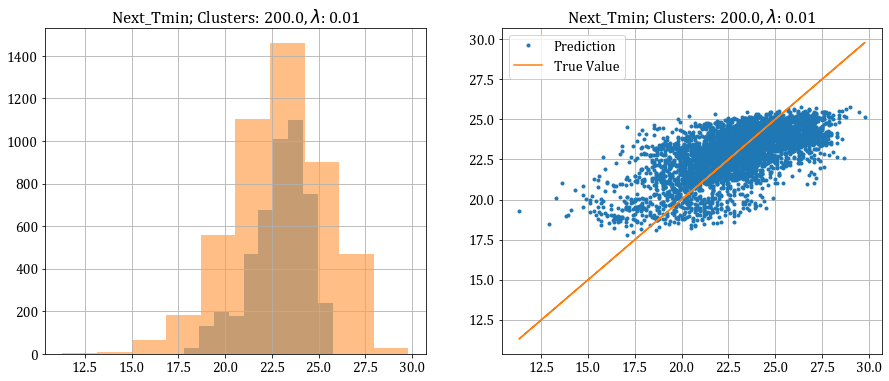

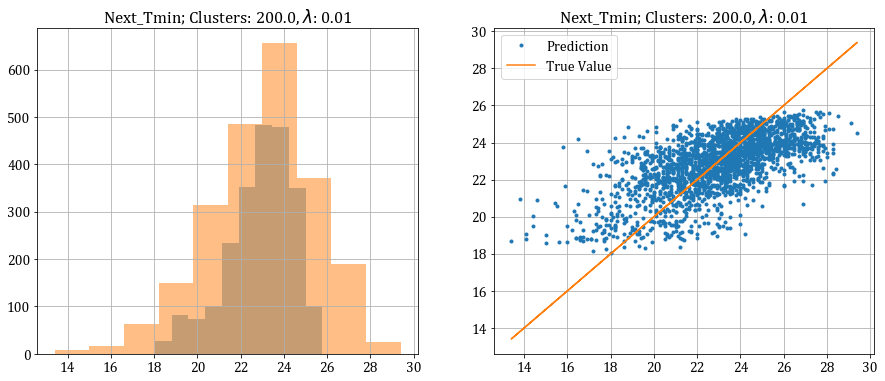

Test RMSE: 1.9047855936564317


In [6]:
min_best_cluster = min_df_error.iloc[0]["Clusters"]
min_lmbda = min_df_error.iloc[0]["lambda"]
pos = num_clusters.index(min_best_cluster)
min_best_centers = min_cluster_centers_list[pos]
min_best_centers.shape

print(min_best_cluster, min_best_centers.shape)

kmeans = min_kmeans_list[pos]
min_best_centers = min_cluster_centers_list[pos]
corresponding_center = min_best_centers[min_label_list[pos],:]

X = df_new.to_numpy()
X_val = df_val_save.to_numpy()
X_test = df_test_save.to_numpy()
val_labels = min_val_label_list[pos]
test_labels = kmeans.predict(X_test)

distance = np.linalg.norm(X-corresponding_center, axis=1)
var = np.var(distance)*distance.size

phi = np.ones((X.shape[0], 1))
phi_val = np.ones((X_val.shape[0], 1))
phi_test = np.ones((X_test.shape[0], 1))

for i in range(int(min_best_cluster)):
    A = X-min_best_centers[i,:]
    A = np.exp(-np.linalg.norm(X-min_best_centers[i,:], axis=1)**2/var)

    B = X_val-min_best_centers[i,:]
    B = np.exp(-np.linalg.norm(X_val-min_best_centers[i,:], axis=1)**2/var)
    
    c = X_test-min_best_centers[i,:]
    c = np.exp(-np.linalg.norm(X_test-min_best_centers[i,:], axis=1)**2/var)

    phi = np.append(phi, np.exp(-np.linalg.norm(X-min_best_centers[i,:], axis=1)**2/var).reshape(-1,1), axis=1)
    phi_val = np.append(phi_val, np.exp(-np.linalg.norm(X_val-min_best_centers[i,:], axis=1)**2/var).reshape(-1,1), axis=1)
    phi_test = np.append(phi_test, np.exp(-np.linalg.norm(X_test-min_best_centers[i,:], axis=1)**2/var).reshape(-1,1), axis=1)

W1 = (np.linalg.inv(phi.T @ phi + min_lmbda*np.identity(phi.shape[1])) @ phi.T) @ df_train["Next_Tmin"]
W1 = W1.reshape(-1,1)
pred = phi @ W1
val_pred = phi_val @ W1
test_pred = phi_test @ W1

plt.figure(figsize=[15,6])
plt.subplot(1, 2, 1)
plt.hist(pred, alpha=0.5)
plt.hist(df_train["Next_Tmin"], alpha=0.5)
plt.title("Next_Tmin; Clusters: "+str(min_best_cluster) + ", $\lambda$: "+str(min_lmbda))
plt.subplot(1, 2, 2)
plt.plot(df_train["Next_Tmin"], pred, ".", label="Prediction")
plt.plot(df_train["Next_Tmin"], df_train["Next_Tmin"], label="True Value")
plt.title("Next_Tmin; Clusters: "+str(min_best_cluster) + ", $\lambda$: "+str(min_lmbda))
plt.legend()

plt.figure(figsize=[15,6])
plt.subplot(1, 2, 1)
plt.hist(test_pred, alpha=0.5)
plt.hist(df_test["Next_Tmin"], alpha=0.5)
plt.title("Next_Tmin; Clusters: "+str(min_best_cluster) + ", $\lambda$: "+str(min_lmbda))
plt.subplot(1, 2, 2)
plt.plot(df_test["Next_Tmin"], test_pred, ".", label="Prediction")
plt.plot(df_test["Next_Tmin"], df_test["Next_Tmin"], label="True Value")
plt.title("Next_Tmin; Clusters: "+str(min_best_cluster) + ", $\lambda$: "+str(min_lmbda))
plt.legend()
plt.show()

test_error = np.linalg.norm(df_test["Next_Tmin"].to_numpy().reshape(-1,1)-test_pred)/(test_pred.size)**0.5
print("Test RMSE:", test_error)


200.0 (200, 17)


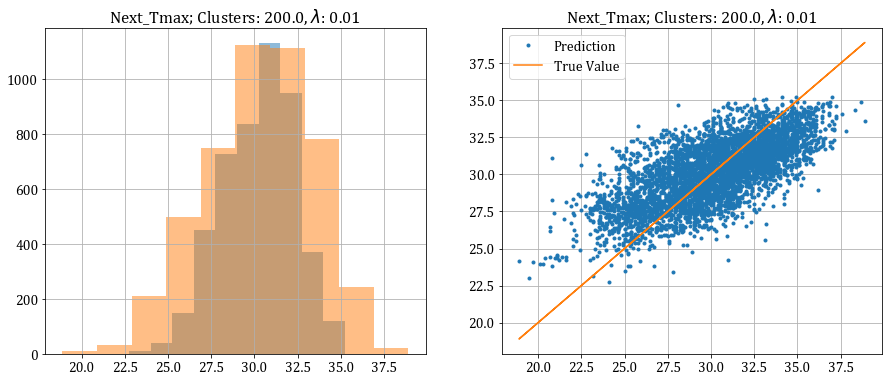

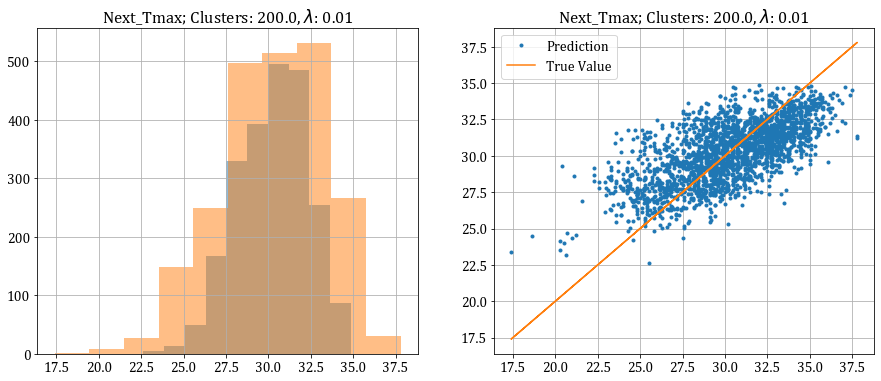

Test RMSE: 2.3025601040043115


In [7]:
max_best_cluster = max_df_error.iloc[0]["Clusters"]
max_lmbda = max_df_error.iloc[0]["lambda"]
pos = num_clusters.index(max_best_cluster)
max_best_centers = max_cluster_centers_list[pos]
max_best_centers.shape

print(max_best_cluster, max_best_centers.shape)

kmeans = max_kmeans_list[pos]
max_best_centers = max_cluster_centers_list[pos]
corresponding_center = max_best_centers[max_label_list[pos],:]

X = df_new.to_numpy()
X_val = df_val_save.to_numpy()
X_test = df_test_save.to_numpy()
val_labels = max_val_label_list[pos]
test_labels = kmeans.predict(X_test)

distance = np.linalg.norm(X-corresponding_center, axis=1)
var = np.var(distance)*distance.size

phi = np.ones((X.shape[0], 1))
phi_val = np.ones((X_val.shape[0], 1))
phi_test = np.ones((X_test.shape[0], 1))

for i in range(int(max_best_cluster)):
    A = X-max_best_centers[i,:]
    A = np.exp(-np.linalg.norm(X-max_best_centers[i,:], axis=1)**2/var)

    B = X_val-max_best_centers[i,:]
    B = np.exp(-np.linalg.norm(X_val-max_best_centers[i,:], axis=1)**2/var)
    
    c = X_test-max_best_centers[i,:]
    c = np.exp(-np.linalg.norm(X_test-max_best_centers[i,:], axis=1)**2/var)

    phi = np.append(phi, np.exp(-np.linalg.norm(X-max_best_centers[i,:], axis=1)**2/var).reshape(-1,1), axis=1)
    phi_val = np.append(phi_val, np.exp(-np.linalg.norm(X_val-max_best_centers[i,:], axis=1)**2/var).reshape(-1,1), axis=1)
    phi_test = np.append(phi_test, np.exp(-np.linalg.norm(X_test-max_best_centers[i,:], axis=1)**2/var).reshape(-1,1), axis=1)

W1 = (np.linalg.inv(phi.T @ phi + max_lmbda*np.identity(phi.shape[1])) @ phi.T) @ df_train["Next_Tmax"]
W1 = W1.reshape(-1,1)
pred = phi @ W1
val_pred = phi_val @ W1
test_pred = phi_test @ W1

plt.figure(figsize=[15,6])
plt.subplot(1, 2, 1)
plt.hist(pred, alpha=0.5)
plt.hist(df_train["Next_Tmax"], alpha=0.5)
plt.title("Next_Tmax; Clusters: "+str(max_best_cluster) + ", $\lambda$: "+str(max_lmbda))
plt.subplot(1, 2, 2)
plt.plot(df_train["Next_Tmax"], pred, ".", label="Prediction")
plt.plot(df_train["Next_Tmax"], df_train["Next_Tmax"], label="True Value")
plt.title("Next_Tmax; Clusters: "+str(max_best_cluster) + ", $\lambda$: "+str(max_lmbda))
plt.legend()

plt.figure(figsize=[15,6])
plt.subplot(1, 2, 1)
plt.hist(test_pred, alpha=0.5)
plt.hist(df_test["Next_Tmax"], alpha=0.5)
plt.title("Next_Tmax; Clusters: "+str(max_best_cluster) + ", $\lambda$: "+str(max_lmbda))
plt.subplot(1, 2, 2)
plt.plot(df_test["Next_Tmax"], test_pred, ".", label="Prediction")
plt.plot(df_test["Next_Tmax"], df_test["Next_Tmax"], label="True Value")
plt.title("Next_Tmax; Clusters: "+str(max_best_cluster) + ", $\lambda$: "+str(max_lmbda))
plt.legend()
plt.show()
test_error = np.linalg.norm(df_test["Next_Tmax"].to_numpy().reshape(-1,1)-test_pred)/(test_pred.size)**0.5


print("Test RMSE:", test_error)